In [54]:
import os
import pandas as pd
from sklearn.metrics import silhouette_score, silhouette_samples, calinski_harabasz_score, davies_bouldin_score
from scipy.spatial.distance import cdist
import time
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import MiniBatchKMeans
from matplotlib import pyplot  as plt
from sklearn.metrics import accuracy_score

from matplotlib import rcParams

rcParams['font.family'] = 'SimHei'
%matplotlib inline

读取csv文件

In [2]:
file_dir = "./eth-nft-token-transfers"
all_file_list = os.listdir(file_dir)

In [58]:
all_df = None
for index, single_file in enumerate(all_file_list):
    single_df= pd.read_csv(
        open(os.path.join(file_dir, single_file),'r'),
        # dtype={"amount": str, "transaction_type": str}
    )
    # 去除zero address
    # single_df = single_df.drop(index=single_df[(single_df.to_address == '0x0000000000000000000000000000000000000000')].index.to_list())
    if index == 0:
        all_df = single_df
    else:
        all_df = pd.concat([all_df, single_df], ignore_index=True)



C:\Users\60198\AppData\Local\Temp\ipykernel_15512\2445671242.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  single_df= pd.read_csv(
C:\Users\60198\AppData\Local\Temp\ipykernel_15512\2445671242.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  single_df= pd.read_csv(
C:\Users\60198\AppData\Local\Temp\ipykernel_15512\2445671242.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  single_df= pd.read_csv(
C:\Users\60198\AppData\Local\Temp\ipykernel_15512\2445671242.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  single_df= pd.read_csv(
C:\Users\60198\AppData\Local\Temp\ipykernel_15512\2445671242.py:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  single_df= pd.read_csv(
C:\Users\60198\AppData\Local\Temp\i

In [60]:
print(all_df.amount.unique())
o = all_df.value.apply(lambda x: 0 if int(x) == 0 else 0)
print(o.value_counts())
p = all_df.operator.apply(lambda x: 0 if x is np.NaN else 1)
print(p.value_counts())
# so is_batch is useless

['1' '20' '5' ... '118232136372824226745' '1068503216381782644191'
 '578818014288020807786']
0    13316554
Name: value, dtype: int64
0    12292783
1     1023771
Name: operator, dtype: int64


构造encoder 负责处理字符串类型

In [61]:
bh_label_encoder = LabelEncoder() #block—hash
ct_label_encoder = LabelEncoder() #
fa_label_encoder = LabelEncoder() #from-address
ta_label_encoder = LabelEncoder()
token_address_label_encoder = LabelEncoder()
th_label_encoder = LabelEncoder()
all_df.block_hash = bh_label_encoder.fit_transform(all_df.block_hash)

all_df.contract_type = ct_label_encoder.fit_transform(all_df.contract_type)

all_df.from_address = fa_label_encoder.fit_transform(all_df.from_address)

all_df.to_address = ta_label_encoder.fit_transform(all_df.to_address)

all_df.token_address = token_address_label_encoder.fit_transform(all_df.token_address)

all_df.transaction_type =all_df.transaction_type.apply(lambda x: 1 if x=='Single' else 0)

all_df.transaction_hash = th_label_encoder.fit_transform(all_df.transaction_hash)

all_df.is_batch = all_df.is_batch.apply(lambda x: 1 if x==True else 0)
all_df.value = all_df.value.apply(lambda x: 0 if int(x) == 0 else 0)
all_df.operator = all_df.operator.apply(lambda x: 0 if x is np.NaN else 1)



In [82]:
df = all_df.fillna(0)
df = df.drop(columns=['block_timestamp', 'log_index', 'transaction_index', 'block_number', 'block_hash','transaction_hash','amount', 'verified', 'is_batch', 'operator'], axis=1)
# 归一化
min_scaler = MinMaxScaler()
df = min_scaler.fit_transform(df)
print(df.shape)
min_scaler = MinMaxScaler()
df = min_scaler.fit_transform(df)
pca = PCA(n_components=0.8)
pca_df = pca.fit_transform(df)
print(pca.n_components_)
print(pca_df.shape)
# print(df[0])
# print(pca_df[0])
print(pca.explained_variance_ratio_)

(13316554, 7)
3
(13316554, 3)
[0.2896412  0.28162149 0.26180933]


In [74]:
#因为维数过多 使用PCA 降维 到80%的保留信息量
pca = PCA(n_components=0.9, svd_solver="full")
pca_df = pca.fit_transform(df)
print(f"降维后的维度数目为：{pca.n_components_}")

降维后的维度数目为：3


In [83]:

# silhouette_score 返回所有样本的轮廓系数的均值
# silhouette_samples 返回每个样本的轮廓系数
# 查看inertia随着n_clusters的变化

inertia_scores = []
meandistortions = []
calin_scores = []
sil_scores = []
davies_scores = []
labels = []
batch_size = 10000
df = pca_df
df = df.astype(np.float32)
for n in range(2, 11) :
    # 使用MiniBatchKMeans 加速训练的速度， 使用k-means++初始化
    km = MiniBatchKMeans(init='k-means++',batch_size=batch_size,n_clusters=n, random_state=28)
    t0 = time.time()
    km.fit(df)
    inertia_scores.append(km.inertia_)
    meandistortions.append(sum(np.min(cdist(df, km.cluster_centers_, "euclidean"), axis=1))/df.shape[0])

    print("n_clusters: {}\tinertia: {}".format(n, km.inertia_))
    t1 = time.time()
    print("train cost time: ", t1 - t0)
    labels.append(km.labels_)

    # 轮廓系数接收的参数中，第二个参数至少有两个分类
    # sc = silhouette_score(df, km.labels_, metric='cosine', sample_size=50000)
    # sil_scores.append(sc)
    # print("n_clusters: {}\tinertia: {}\tsilhoutte_score: {}".format(
    #     n, km.inertia_, sc))

    t2 = time.time()

    print("silhouette cost time: ", t2-t1)
    calinski_score = calinski_harabasz_score(df, km.labels_)
    calin_scores.append(calinski_score)
    davies_score = davies_bouldin_score(df, km.labels_)
    davies_scores.append(davies_score)
    print("calin cost time: ", time.time() - t2)
    print("n_clusters: {}\tcalinski_harabasz_score: {}".format(
        n, calinski_score))
    print("n_clusters: {}\tdavies_score: {}".format(
        n, davies_score))


# 可以看出inertia的值是越来越小的。但是我们观察原始数据
# 显然分为2-5类是最好的结果，所以这里的inertia作为指标不太适用


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 2	inertia: 2594991.0
train cost time:  2.3088173866271973
silhouette cost time:  0.0
calin cost time:  2.1457901000976562
n_clusters: 2	calinski_harabasz_score: 3875560.82406937
n_clusters: 2	davies_score: 1.7284378395938638


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 3	inertia: 1700224.125
train cost time:  7.497776746749878
silhouette cost time:  0.0
calin cost time:  2.3414416313171387
n_clusters: 3	calinski_harabasz_score: 6475073.905490946
n_clusters: 3	davies_score: 1.1465903435402867


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 4	inertia: 1298895.5
train cost time:  2.407942056655884
silhouette cost time:  0.0
calin cost time:  2.5302772521972656
n_clusters: 4	calinski_harabasz_score: 7002435.571162069
n_clusters: 4	davies_score: 0.9279254997237804


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 5	inertia: 1030726.125
train cost time:  6.610812187194824
silhouette cost time:  0.0
calin cost time:  2.62861967086792
n_clusters: 5	calinski_harabasz_score: 7485227.874379792
n_clusters: 5	davies_score: 0.8653659818305334


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 6	inertia: 873089.75
train cost time:  6.0643579959869385
silhouette cost time:  0.0
calin cost time:  2.7826292514801025
n_clusters: 6	calinski_harabasz_score: 7547539.268274369
n_clusters: 6	davies_score: 0.9964466707858689


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 7	inertia: 782156.6875
train cost time:  6.207188367843628
silhouette cost time:  0.0
calin cost time:  2.874826431274414
n_clusters: 7	calinski_harabasz_score: 7278065.125338916
n_clusters: 7	davies_score: 0.953809557933145


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 8	inertia: 729886.0625
train cost time:  6.096706390380859
silhouette cost time:  0.0
calin cost time:  3.0132341384887695
n_clusters: 8	calinski_harabasz_score: 6822509.411563607
n_clusters: 8	davies_score: 1.0594280150163105


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 9	inertia: 666889.5
train cost time:  4.107879638671875
silhouette cost time:  0.0
calin cost time:  3.1326465606689453
n_clusters: 9	calinski_harabasz_score: 6689245.843737408
n_clusters: 9	davies_score: 1.0113637371856017


D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


n_clusters: 10	inertia: 621329.875
train cost time:  6.235481262207031
silhouette cost time:  0.0
calin cost time:  3.219066619873047
n_clusters: 10	calinski_harabasz_score: 6490964.1813591765
n_clusters: 10	davies_score: 0.9928944444185147


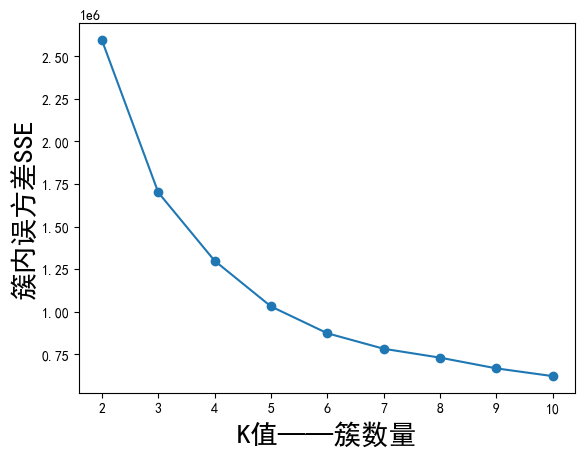

In [84]:
    #绘制曲线
plt.plot(range(2,11),inertia_scores,marker="o")
plt.xlabel("K值——簇数量",size=20)
plt.ylabel("簇内误方差SSE",size=20)
plt.show()


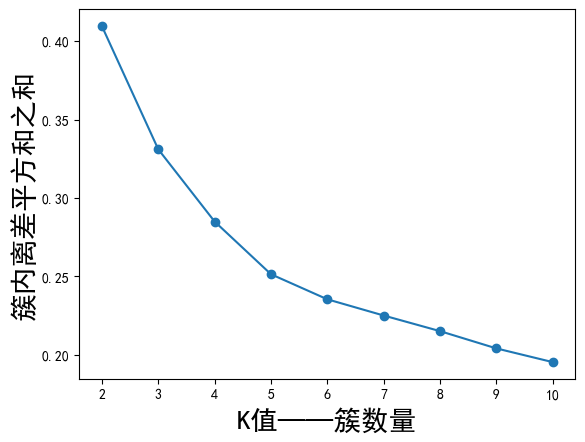

In [85]:
#肘部法
plt.plot(range(2,11),meandistortions,marker="o")
plt.xlabel("K值——簇数量",size=20)
plt.ylabel("簇内离差平方和之和",size=20)
plt.show()

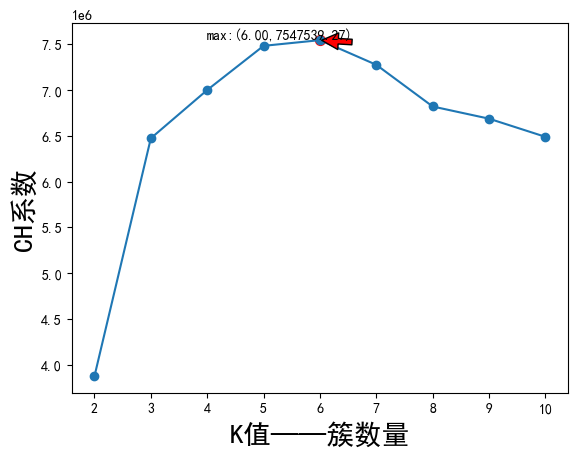

In [86]:
#CH系数
max_idx = np.argmax(calin_scores)
max_x = range(2, 11)[max_idx]
max_y = calin_scores[max_idx]
plt.plot(range(2,11),calin_scores,marker="o")
plt.xlabel("K值——簇数量",size=20)
plt.ylabel("CH系数",size=20)
plt.scatter(max_x, max_y, color='red', s=50)
plt.annotate(f'max:({max_x:.2f},{max_y:.2f})', xy=(max_x, max_y), xytext=(max_x-2, max_y+0.005),
             arrowprops=dict(facecolor='red', shrink=0.05))
plt.show()

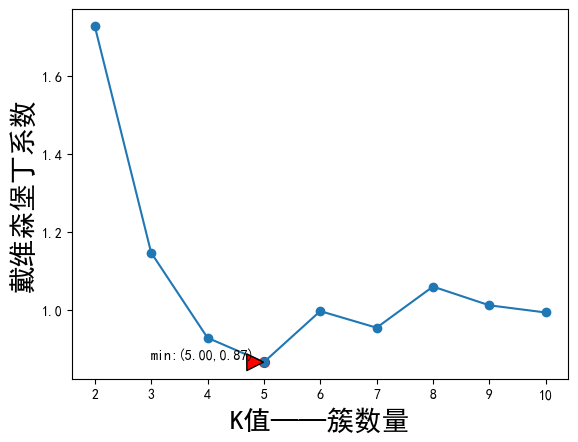

In [87]:
#戴维森堡丁系数
min_idx = np.argmin(davies_scores)
min_x = range(2, 11)[min_idx]
min_y = davies_scores[min_idx]
plt.plot(range(2,11),davies_scores,marker="o")
plt.xlabel("K值——簇数量",size=20)
plt.ylabel("戴维森堡丁系数",size=20)
plt.scatter(min_x, min_y, color='red', s=50)
plt.annotate(f'min:({min_x:.2f},{min_y:.2f})', xy=(min_x, min_y), xytext=(min_x-2, min_y+0.005),
             arrowprops=dict(facecolor='red', shrink=0.05))
plt.show()

In [88]:
# 所以k选5时候的效果最好
km = MiniBatchKMeans(init='k-means++',batch_size=batch_size,n_clusters=5, random_state=28)
y_pred = km.fit_predict(df)

D:\softs\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


D:\softs\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


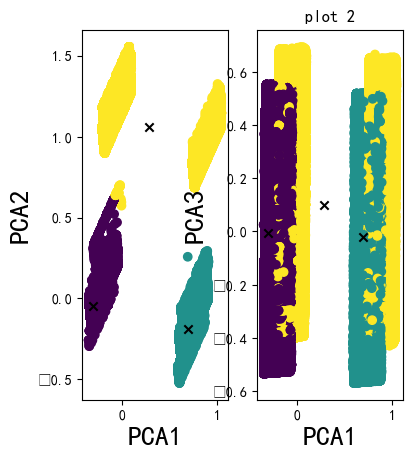

In [73]:
#plot 1
plt.subplot(1, 3, 1)
# plt.title('plot 1')

plt.scatter(pca_df[:, 0], pca_df[:, 1], c=km.labels_)
centers = km.cluster_centers_
x_min, x_max = pca_df[:, 0].min() - 1, pca_df[:, 0].max() + 1
y_min, y_max = pca_df[:, 1].min() - 1, pca_df[:, 1].max() + 1

# 通过获取的x和y的值来生成要绘制的每一个点的坐标,h来设置步长（精度）
h = 0.05
xx = np.arange(x_min, x_max)
yy = np.arange(y_min, y_max)
# plt.pcolormeash(xx, yy, km.labels_, cmap='OrRd')
plt.scatter(centers[:,0], centers[:, 1], c='black', marker='x')
plt.xlabel("PCA1",size=20)
plt.ylabel("PCA2",size=20)

#plot 2
plt.subplot(1, 3, 2)
plt.title('plot 2')
plt.scatter(pca_df[:, 0], pca_df[:, 2], c=km.labels_)
centers = km.cluster_centers_
x_min, x_max = pca_df[:, 0].min() - 1, pca_df[:, 0].max() + 1
y_min, y_max = pca_df[:, 2].min() - 1, pca_df[:, 2].max() + 1
# xx = np.arange(x_min, x_max)
# yy = np.arange(y_min, y_max)
# # plt.pcolormeash(xx, yy, km.labels_, cmap='OrRd')
plt.scatter(centers[:,0], centers[:, 2], c='black', marker='x')
plt.xlabel("PCA1",size=20)
plt.ylabel("PCA3",size=20)


plt.show()


original_to_address_list = ta_label_encoder.inverse_transform(all_df.to_address)

# for y_pred_item, original_to_address in zip(y_pred[:100], original_to_address_list[:100]):
#     print(f'to_address: {original_to_address},  label predict is {y_pred_item} ')

# for df_item, y_pred_item in zip(df[0:1], y_pred[0: 1]):
#     print(ta_label_encoder.inverse_transform(df_item[7]))

D:\softs\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


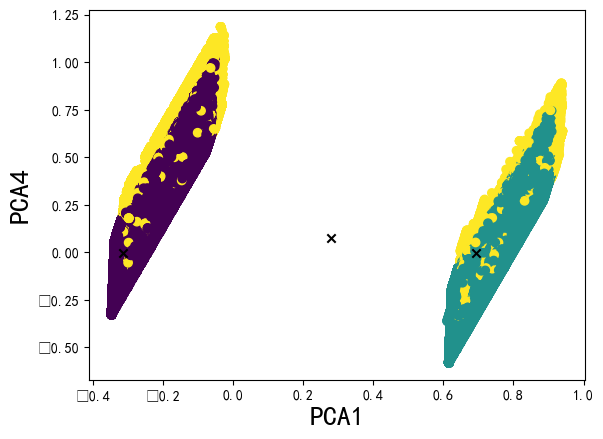

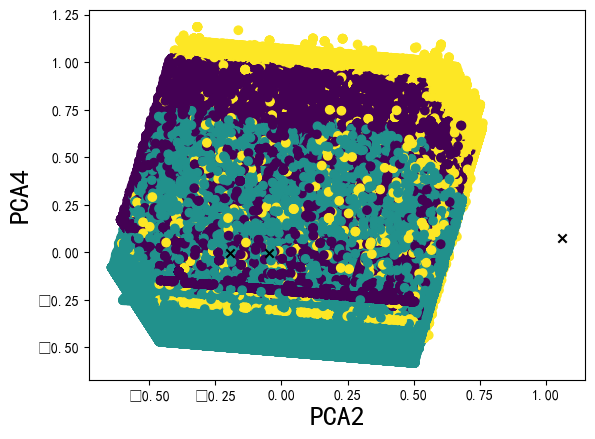

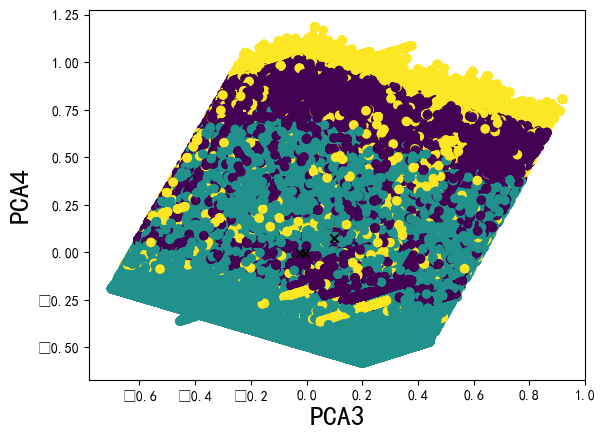

In [77]:
plt.scatter(pca_df[:, 0], pca_df[:, 3], c=km.labels_)
centers = km.cluster_centers_
plt.scatter(centers[:,0], centers[:, 3], c='black', marker='x')
plt.xlabel("PCA1",size=20)
plt.ylabel("PCA4",size=20)
plt.show()

plt.scatter(pca_df[:, 1], pca_df[:, 3], c=km.labels_)
centers = km.cluster_centers_
plt.scatter(centers[:,1], centers[:, 3], c='black', marker='x')
plt.xlabel("PCA2",size=20)
plt.ylabel("PCA4",size=20)
plt.show()

plt.scatter(pca_df[:, 2], pca_df[:, 3], c=km.labels_)
centers = km.cluster_centers_
plt.scatter(centers[:,2], centers[:, 3], c='black', marker='x')
plt.xlabel("PCA3",size=20)
plt.ylabel("PCA4",size=20)
plt.show()

D:\softs\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


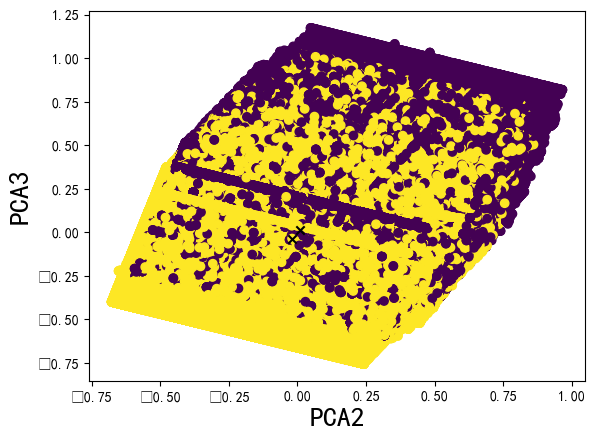

In [56]:
plt.scatter(pca_df[:, 1], pca_df[:, 2], c=km.labels_)
centers = km.cluster_centers_
plt.scatter(centers[:,1], centers[:, 2], c='black', marker='x')
plt.xlabel("PCA2",size=20)
plt.ylabel("PCA3",size=20)
plt.show()

到处cluster的结果至不同的文件夹

In [13]:
result_df = all_df
result_df['cluster_num'] = y_pred
for cluster_value, cluster_group in result_df.groupby('cluster_num'):
    if not os.path.exists(os.path.join('cluster_result', str(cluster_value))):
        os.mkdir(os.path.join('cluster_result', str(cluster_value)))
    for time_value, time_group in  cluster_group.groupby('block_timestamp'):
        file_name = os.path.join('cluster_result', os.path.join( str(cluster_value),str(time_value).split('T')[0] + '.csv') )
        print(file_name)
        time_group.to_csv(file_name, index=False, mode='w', encoding='utf-8')



cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_result\0\2022-06-01.csv
cluster_

D:\softs\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


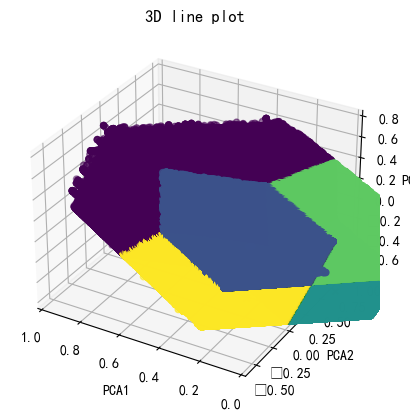

In [89]:
ax = plt.axes(projection='3d')
#调用 ax.plot3D创建三维线图

ax.set_title('3D line plot')
centers = km.cluster_centers_
# plt.pcolormeash(xx, yy, km.labels_, cmap='OrRd')
ax.scatter3D(centers[:,0], centers[:, 1], centers[:,2], c='black', marker='x')
ax.scatter3D(pca_df[:, 0], pca_df[:, 1], pca_df[:, 2], c=km.labels_)
plt.xlim(1, 0)
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')
# ax.view_init(60, 35)
plt.show()